In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
import requests
from io import BytesIO

# OpenCV 출력
from google.colab.patches import cv2_imshow

# 원근법 변환(Perspective Transformation)
* cv2.getPerspectiveTransform()
* cv2.warpPerspective()

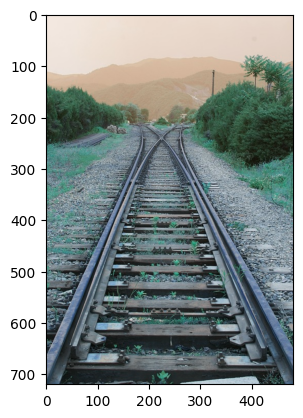

In [7]:
image=cv2.imread('/content/train.jpg')
plt.imshow(image)

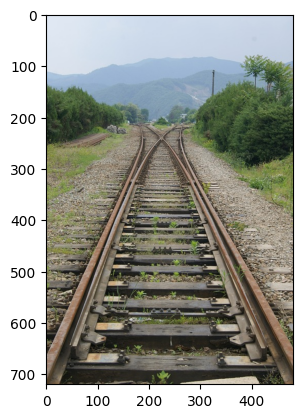

In [8]:
image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

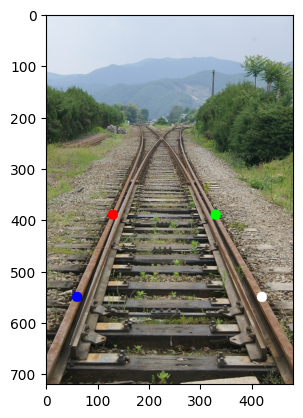

In [11]:
top_left=(130,390)
top_right=(330,390)
bottom_left=(60,550)
bottom_right=(420,550)

cv2.circle(image, top_left,10,(255,0,0),-1)
cv2.circle(image, top_right,10,(0,255,0),-1)
cv2.circle(image, bottom_left,10,(0,0,255),-1)
cv2.circle(image, bottom_right,10,(255,255,255),-1)

plt.imshow(image)
plt.show()

In [15]:
pt1=np.float32([top_left, top_right, bottom_right, bottom_left])

# 4개 포인트의 가로 세로 길이의 절대값
w1=abs(bottom_right[0]-bottom_left[0]) # 가로
w2=abs(top_right[0]-top_left[0])
h1=abs(top_right[0]-bottom_right[1]) # 세로. y값이므로 1
h2=abs(top_left[0]-bottom_left[1])

# 가로, 세로 최대 길이
max_width=max([w1,w2])
max_height=max([h1,h2])

pt2=np.float32([[0,0],[max_width-1,0],[max_width-1, max_height-1],[0,max_height-1]])

In [16]:
M=cv2.getPerspectiveTransform(pt1,pt2)
pst=cv2.warpPerspective(image,M, (max_width,max_height))

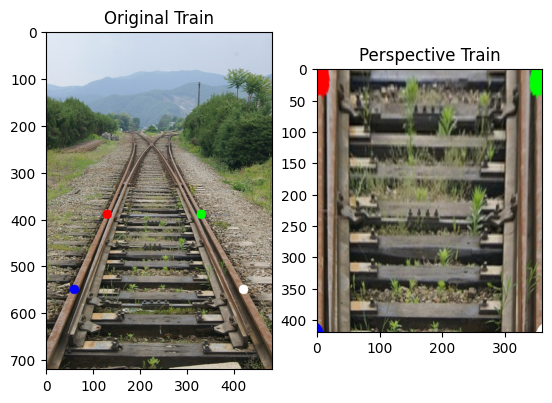

In [18]:
plt.subplot(121)
plt.imshow(image)
plt.title('Original Train')

plt.subplot(122)
plt.imshow(pst)
plt.title('Perspective Train')
plt.show()

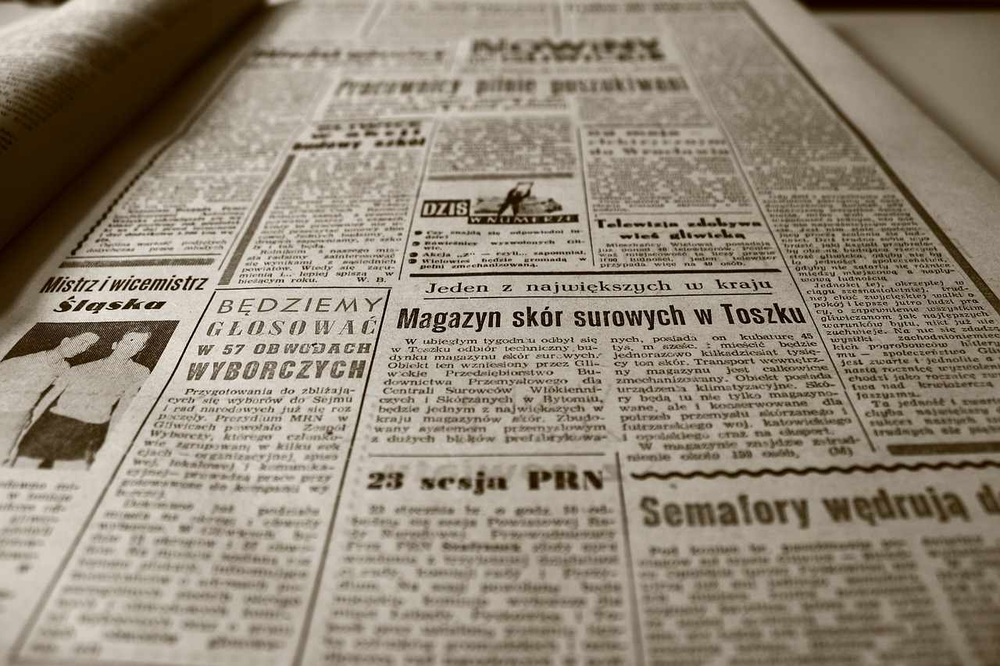

In [20]:
image2=cv2.imread('/content/newspaper_1280.jpg')
cv2_imshow(image2)

In [22]:
# 가로 640, 세로 240
width, height=640, 240

pt1=np.array([[500,355],[1010,340],[1130,600],[445,610]], dtype=np.float32)
pt2=np.array([[0,0],[width,0],[width,height],[0,height]], dtype=np.float32)

M=cv2.getPerspectiveTransform(pt1, pt2)
psn=cv2.warpPerspective(image2,M,(width,height))

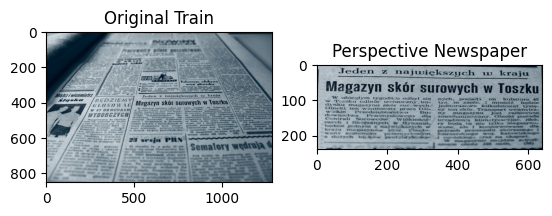

In [23]:
plt.subplot(121)
plt.imshow(image2)
plt.title('Original Train')

plt.subplot(122)
plt.imshow(psn)
plt.title('Perspective Newspaper')
plt.show()

# 이미지 연산(Image Operation)
* 이미지는 배열로 표현 가능하기 때문에 연산이 가능

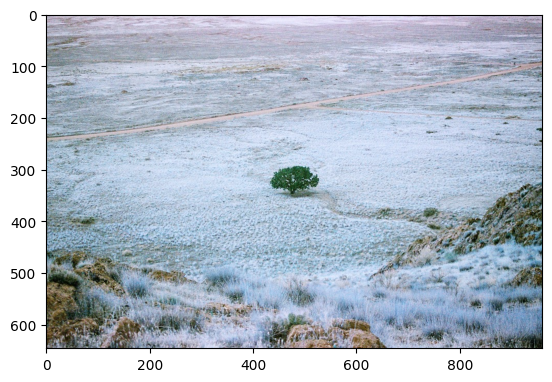

In [25]:
tree=cv2.imread('/content/tree.jpg')
plt.imshow(tree)
plt.show()

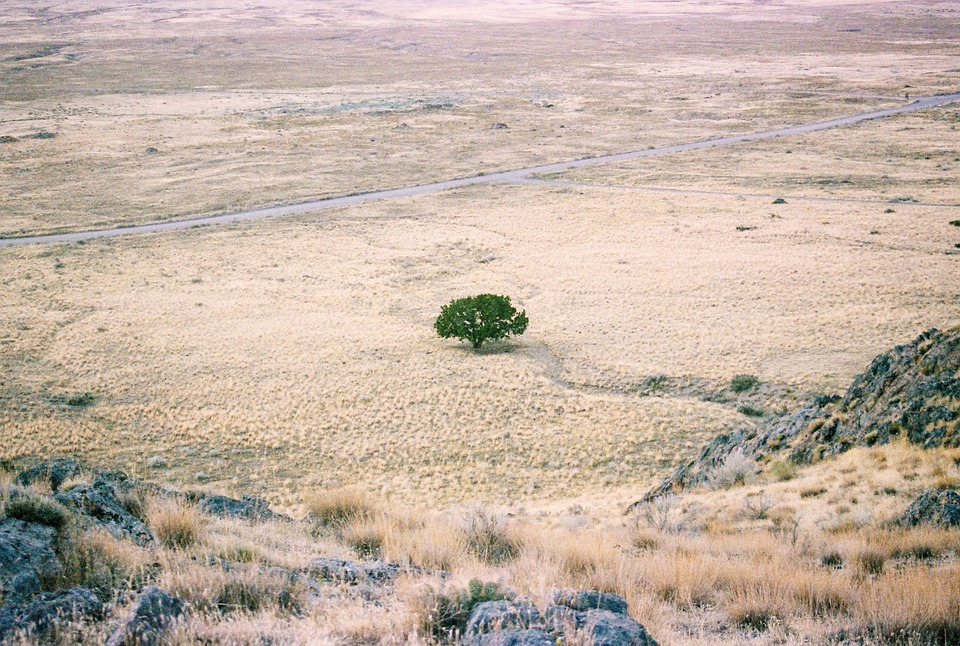

In [26]:
cv2_imshow(tree)

In [27]:
px_value=tree[300,400]
print(px_value)

[157 171 194]


In [29]:
px_channel=tree[300,400,2]
print(px_channel)

194


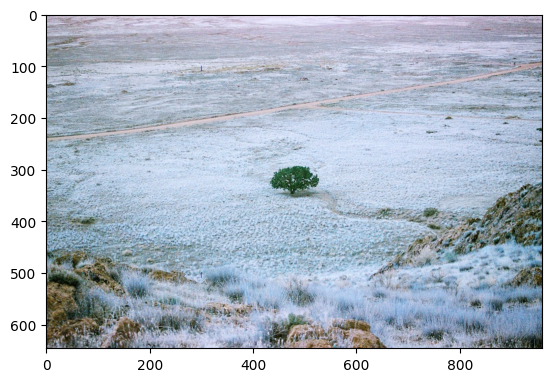

In [33]:
tree[100,300]=[0,0,255]
tree[101,300]=[0,0,255]
tree[102,300]=[0,0,255]
tree[103,300]=[0,0,255]
tree[104,300]=[0,0,255]
tree[105,300]=[0,0,255]
tree[106,300]=[0,0,255]
tree[107,300]=[0,0,255]
tree[108,300]=[0,0,255]
tree[109,300]=[0,0,255]
tree[110,300]=[0,0,255]

plt.imshow(tree)
plt.show()

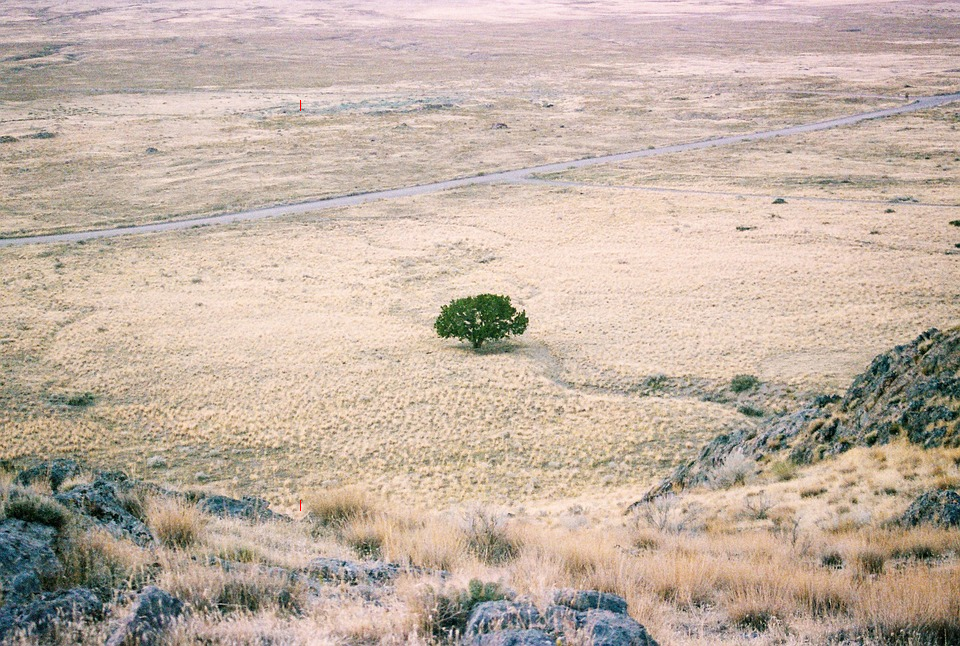

In [34]:
cv2_imshow(tree)

In [35]:
print(tree[:100, :100].shape)

(100, 100, 3)


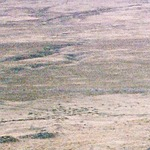

In [38]:
cv2_imshow(tree[:150,:150])

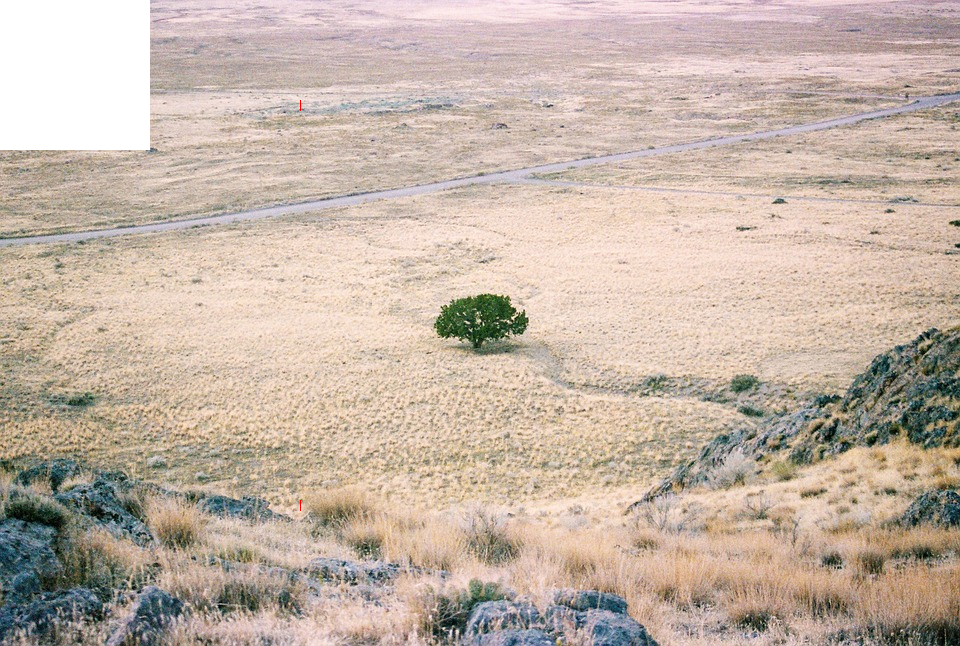

In [39]:
white_box=tree[:150, :150]
white_box=[255,255,255]
tree[:150, :150]=white_box
cv2_imshow(tree)

# Region of Image(ROI)
* 이미지 작업 시 주로 특정 픽셀 단위보다는 특정 영역 단위로 작업

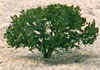

In [40]:
tree2=tree[290:360,430:530]
cv2_imshow(tree2)

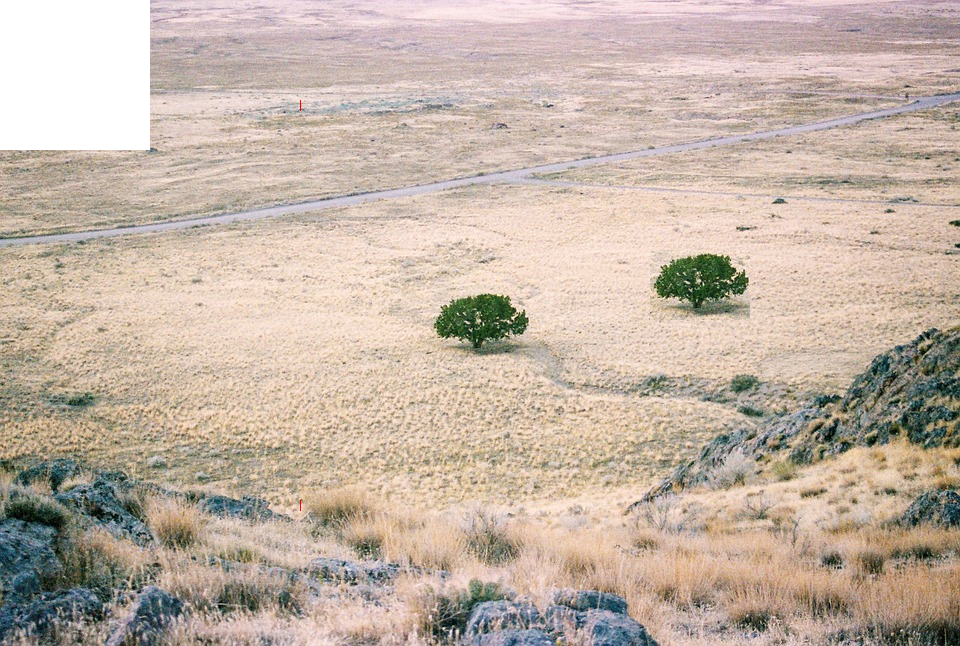

In [41]:
tree[250:320, 650:750]=tree2
cv2_imshow(tree)

# 비트연산
* AND, OR, NOT, XOR 연산
- bitwise_and : 둘 다 0이 아닌 경우만 값을 통과
- bitwise_or : 둘 중 하나가 0이 아니면 값을 통과
- bitwise_not : 해당 값에 대해 부정값을 통과
- bitwise_xor : 두 요소의 논리적 베타값 통과

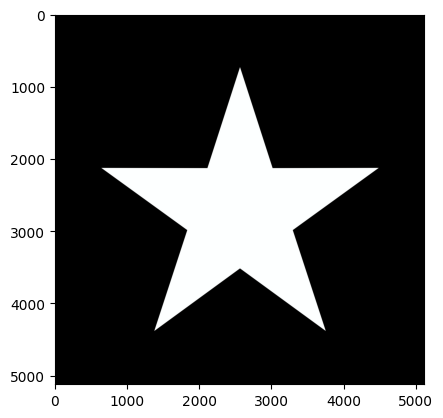

In [42]:
star=cv2.imread('/content/star.jpg')
plt.imshow(star)
plt.show()

In [43]:
print(star.shape)

(5120, 5120, 3)


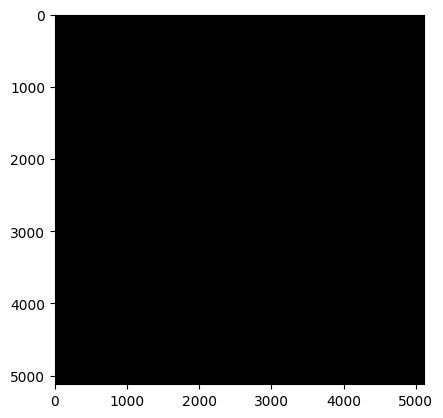

In [44]:
black=np.zeros((5120,5120,3))
plt.imshow(black)
plt.show()

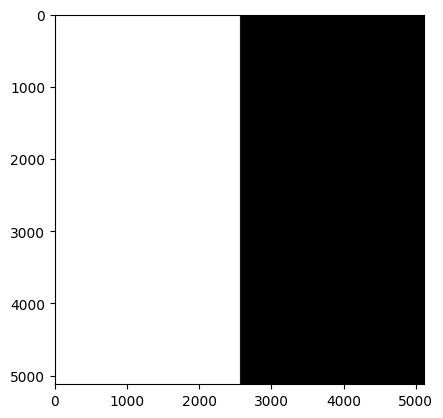

In [45]:
black[:, :2560, :]=(255,255,255)
plt.imshow(black)
plt.show()

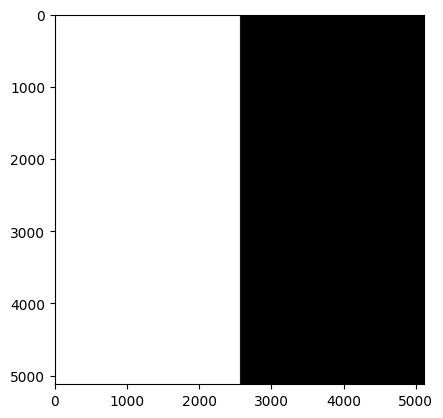

In [47]:
black=black.astype(np.uint8)
plt.imshow(black)
plt.show()

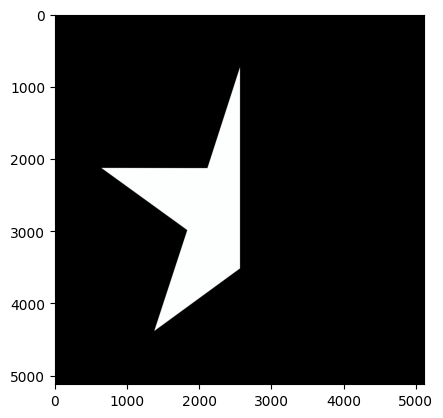

In [48]:
# bitwise_and 연산 : 둘 다 0이 아닌 경우만 값을 통과
result_and=cv2.bitwise_and(black, star)
plt.imshow(result_and)
plt.show()

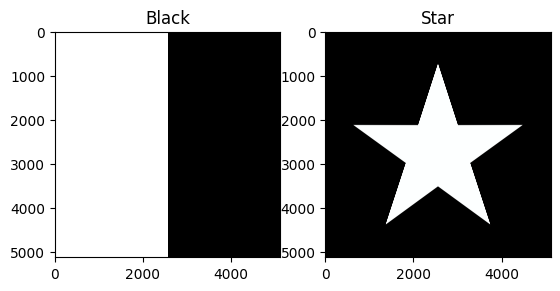

In [50]:
plt.subplot(121)
plt.imshow(black)
plt.title('Black')

plt.subplot(122)
plt.imshow(star)
plt.title('Star')
plt.show()

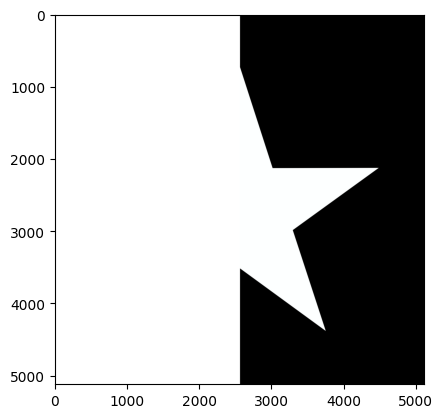

In [51]:
# bitwise_or 연산 : 둘 중 하나가 0이 아니면 값을 통과
result_or=cv2.bitwise_or(black, star)
plt.imshow(result_or)
plt.show()

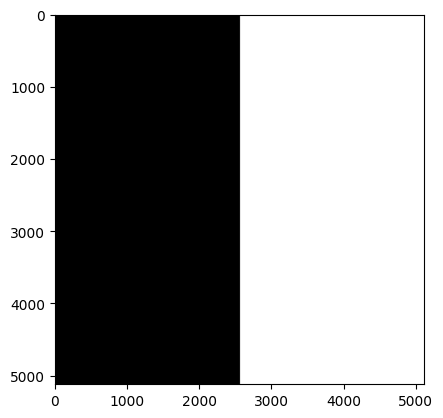

In [52]:
# bitwise_not 연산 : 해당 값에 대해 부정값을 통과
black_not=cv2.bitwise_not(black)
plt.imshow(black_not)
plt.show()

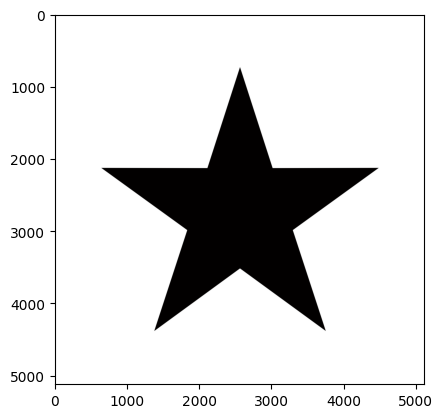

In [55]:
star_not=cv2.bitwise_not(star)
plt.imshow(star_not)
plt.show()